# Deep Learning : Neural Style Transfer

Neural Style Transfer, an algorithm created by [Gatys et al. (2015).](https://arxiv.org/abs/1508.06576)


## Table of Contents

- [1 - Packages](#1)
- [2 - Problem Statement](#2)
- [3 - Transfer Learning](#3)
- [4 - Neural Style Transfer (NST)](#4)
    - [4.1 - Computing the Content Cost](#4-1)
        - [4.1.1 - Make Generated Image G Match the Content of Image C](#4-1-1)
        - [4.1.2 - Content Cost Function  𝐽𝑐𝑜𝑛𝑡𝑒𝑛𝑡(𝐶,𝐺)](#4-1-2)
            - [compute_content_cost](#ex-1)
    - [4.2 - Computing the Style Cost](#4-2)
        - [4.2.1 - Style Matrix](#4-2-1)
            - [ gram_matrix](#ex-2)
        - [4.2.2 - Style Cost](#4-2-2)
            - [ compute_layer_style_cost](#ex-3)
        - [4.2.3 Style Weights](#4-2-3)
            - [ compute_style_cost](#ex-4)
    - [4.3 - Defining the Total Cost to Optimize](#4-3)
        - [total_cost](#ex-5)
- [5 - Solving the Optimization Problem](#5)
    - [5.1 Load the Content Image](#5-1)
    - [5.2 Load the Style Image](#5-2)
    - [5.3 Randomly Initialize the Image to be Generated](#5-3)
    - [5.4 - Load Pre-trained VGG19 Model](#5-4)
    - [5.5 - Compute Total Cost](#5-5)
        - [5.5.1 - Compute Content Cost](#5-5-1)
        - [5.5.2 - Compute Style Cost](#5-5-2)
            - [ train_step](#ex-6)
    - [5.6 - Train the Model](#5-6)
- [6 - Test With Your Own Image](#6)
- [7 - References](#7)




<a name='1'></a>
## 1 - Packages

Run the following code cell to import the necessary packages and dependencies you will need to perform Neural Style Transfer.

In [1]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.python.framework.ops import EagerTensor
import pprint
%matplotlib inline

<a name='2'></a>
## 2 - Problem Statement

Neural Style Transfer (NST) is one of the most fun and interesting optimization techniques in deep learning. It merges two images, namely: a <strong>"content" image (C)</strong> and a <strong>"style" image (S)</strong>, to create a <strong>"generated" image (G)</strong>. The generated image G combines the "content" of the image C with the "style" of image S. 

<img src="images/louvre_generated.png" style="width:750px;height:200px;">

<a name='3'></a>
## 3 - Transfer Learning


Neural Style Transfer (NST) uses a previously trained convolutional network, and builds on top of that. The idea of using a network trained on a different task and applying it to a new task is called transfer learning. 

We will use the epynomously named VGG network from the [original NST paper](https://arxiv.org/abs/1508.06576) published by the Visual Geometry Group at University of Oxford in 2014. Specifically,VGG-19, a 19-layer version of the VGG network. This model has already been trained on the very large ImageNet database, and has learned to recognize a variety of low level features (at the shallower layers) and high level features (at the deeper layers). 

Run the following code to load parameters from the VGG model. This may take a few seconds. 

In [61]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')

vgg.trainable = False
pp.pprint(vgg)

<a name='4'></a>
## 4 - Neural Style Transfer (NST)

Building the Neural Style Transfer (NST) algorithm in three steps:

- First, build the content cost function $J_{content}(C,G)$
- Second, build the style cost function $J_{style}(S,G)$
- Finally, put it all together to get $J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$. 

<a name='4-1'></a>
### 4.1 - Computing the Content Cost

<a name='4-1-1'></a>
#### 4.1.1 - Make Generated Image G Match the Content of Image C

One goal you should aim for when performing NST is for the content in generated image G to match the content of image C. To do so, you'll need an understanding of <b> shallow versus deep layers </b>:

* The shallower layers of a ConvNet tend to detect lower-level features such as <i>edges and simple textures</i>.
* The deeper layers tend to detect higher-level features such as more <i> complex textures and object classes</i>. 

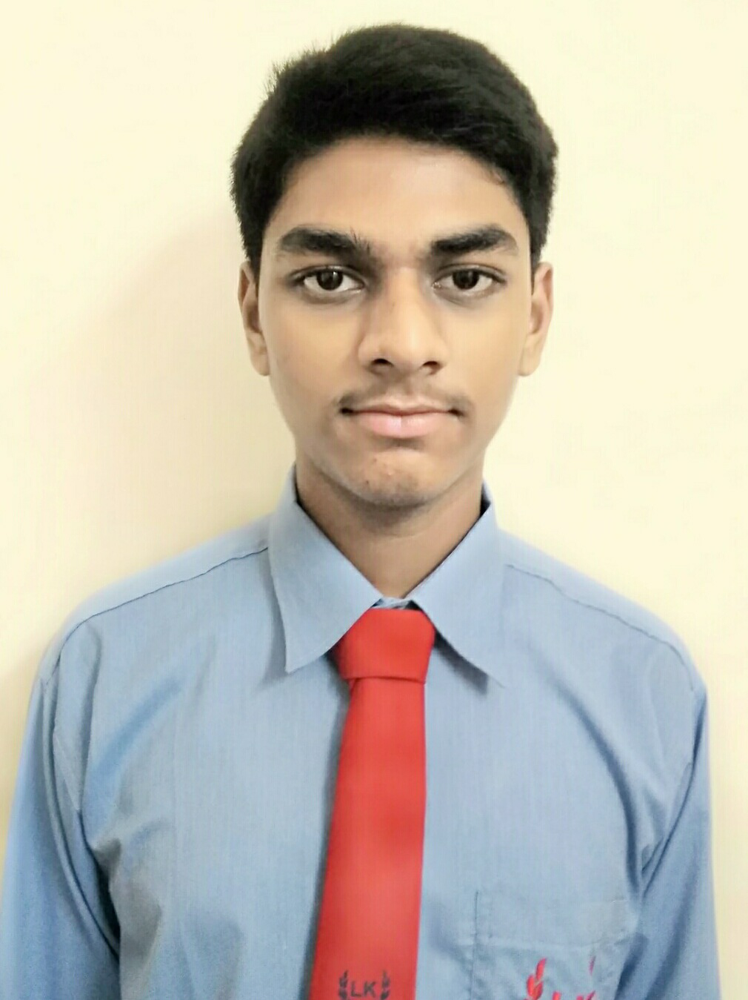

In [62]:
content_image = Image.open("images/omrai.jpg")
content_image

<a name='4-1-2'></a>
#### 4.1.2 - Content Cost Function $J_{content}(C,G)$
One goal you should aim for when performing NST is for the content in generated image G to match the content of image C. A method to achieve this is to calculate the content cost function, which will be defined as:

$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\tag{1} $$

* Here, $n_H, n_W$ and $n_C$ are the height, width and number of channels of the hidden layer you have chosen, and appear in a normalization term in the cost. 
* For clarity, note that $a^{(C)}$ and $a^{(G)}$ are the 3D volumes corresponding to a hidden layer's activations. 
* In order to compute the cost $J_{content}(C,G)$, it might also be convenient to unroll these 3D volumes into a 2D matrix, as shown below.
* Technically this unrolling step isn't needed to compute $J_{content}$, but it will be good practice for when you do need to carry out a similar operation later for computing the style cost $J_{style}$.

<a name='ex-1'></a>
### compute_content_cost

Compute the "content cost" using TensorFlow. 

**Instructions**: 

`a_G`: hidden layer activations representing content of the image G
<br>
`a_C`: hidden layer activations representing content of the image C 

The 3 steps to implement this function are:
1. Retrieve dimensions from `a_G`: 
2. Unroll `a_C` and `a_G` as explained in the picture above
3. Compute the content cost:

In [63]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost
    
    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
    
    # Retrieve dimensions from a_G (≈1 line)
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape a_C and a_G (≈2 lines)
    a_C_unrolled = tf.reshape(a_C, shape=[m, n_H * n_W, n_C]) # Or tf.reshape(a_C, shape=[m, -1 , n_C])
    a_G_unrolled = tf.reshape(a_G, shape=[m, n_H * n_W, n_C]) # Or tf.reshape(a_G, shape=[m, -1 , n_C])
    
    # compute the cost with tensorflow (≈1 line)
    J_content =  tf.reduce_sum(tf.square(a_C_unrolled - a_G_unrolled))/(4.0 * n_H * n_W * n_C)
    
    
    return J_content

In [64]:
tf.random.set_seed(1)
a_C = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_content = compute_content_cost([a_C], [a_G])
J_content_0 = compute_content_cost([a_C], [a_C])
assert type(J_content) == EagerTensor, "Use the tensorflow function"
assert np.isclose(J_content_0, 0.0), "Wrong value. compute_content_cost(A, A) must be 0"
assert np.isclose(J_content, 7.0568767), f"Wrong value. Expected {7.0568767},  current{J_content}"

print("J_content = " + str(J_content))

J_content = tf.Tensor(7.056877, shape=(), dtype=float32)


<a name='4-2'></a>
### 4.2 - Computing the Style Cost

For the running example, you will use the following style image: 

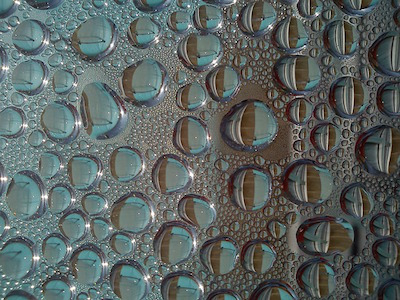

In [65]:
example = Image.open("images/drop-of-water.jpg")
example

<a name='4-2-1'></a>
#### 4.2.1 - Style Matrix

#### Gram matrix
* The style matrix is also called a "Gram matrix." 
* In linear algebra, the Gram matrix G of a set of vectors $(v_{1},\dots ,v_{n})$ is the matrix of dot products, whose entries are ${\displaystyle G_{ij} = v_{i}^T v_{j} = np.dot(v_{i}, v_{j})  }$. 
* In other words, $G_{ij}$ compares how similar $v_i$ is to $v_j$: If they are highly similar, you would expect them to have a large dot product, and thus for $G_{ij}$ to be large. 

#### Two meanings of the variable $G$
* Note that there is an unfortunate collision in the variable names used here. Following the common terminology used in the literature: 
    * $G$ is used to denote the Style matrix (or Gram matrix) 
    * $G$ also denotes the generated image. 
* For the sake of clarity, in this assignment $G_{gram}$ will be used to refer to the Gram matrix, and $G$ to denote the generated image.


#### Compute Gram matrix $G_{gram}$
You will compute the Style matrix by multiplying the "unrolled" filter matrix with its transpose:

$$\mathbf{G}_{gram} = \mathbf{A}_{unrolled} \mathbf{A}_{unrolled}^T$$

#### $G_{(gram)ij}$: correlation
The result is a matrix of dimension $(n_C,n_C)$ where $n_C$ is the number of filters (channels). The value $G_{(gram)i,j}$ measures how similar the activations of filter $i$ are to the activations of filter $j$. 

#### $G_{(gram),ii}$: prevalence of patterns or textures
* The diagonal elements $G_{(gram)ii}$ measure how "active" a filter $i$ is. 
* For example, suppose filter $i$ is detecting vertical textures in the image. Then $G_{(gram)ii}$ measures how common  vertical textures are in the image as a whole.
* If $G_{(gram)ii}$ is large, this means that the image has a lot of vertical texture. 


By capturing the prevalence of different types of features ($G_{(gram)ii}$), as well as how much different features occur together ($G_{(gram)ij}$), the Style matrix $G_{gram}$ measures the style of an image. 

<a name='ex-2'></a>
###  gram_matrix
The gram matrix of A is $G_A = AA^T$. 


In [66]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """  
    #(≈1 line)
    GA = tf.matmul(A, tf.transpose(A))
    
    return GA

In [67]:
tf.random.set_seed(1)
A = tf.random.normal([3, 2 * 1], mean=1, stddev=4)
GA = gram_matrix(A)

assert type(GA) == EagerTensor, "Use the tensorflow function"
assert GA.shape == (3, 3), "Wrong shape. Check the order of the matmul parameters"
assert np.allclose(GA[0,:], [63.1888, -26.721275, -7.7320204]), "Wrong values."

print("GA = \n" + str(GA))

GA = 
tf.Tensor(
[[ 63.1888    -26.721275   -7.7320204]
 [-26.721275   12.76758    -2.5158243]
 [ -7.7320204  -2.5158243  23.752384 ]], shape=(3, 3), dtype=float32)


<a name='4-2-2'></a>
#### 4.2.2 - Style Cost

 next goal will be to minimize the distance between the Gram matrix of the "style" image S and the Gram matrix of the "generated" image G. 
* The style cost for a layer is defined as: 

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2\tag{2} $$

* $G_{gram}^{(S)}$ Gram matrix of the "style" image.
* $G_{gram}^{(G)}$ Gram matrix of the "generated" image.

<a name='ex-3'></a>
### compute_layer_style_cost
Compute the style cost for a single layer. 

**Instructions**: The 3 steps to implement this function are:
1. Retrieve dimensions from the hidden layer activations a_G: 
2. Unroll the hidden layer activations a_S and a_G into 2D matrices, 
3. Compute the Style matrix of the images S and G. (Use the function you had previously written.) 
4. Compute the Style cost

In [68]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    # Retrieve dimensions from a_G (≈1 line)
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape the images to have them of shape (n_C, n_H*n_W) (≈2 lines)
    a_S = tf.transpose(tf.reshape(a_S, shape=[-1, n_C]))
    # OR a_S = tf.transpose(tf.reshape(a_S, shape=[ n_H * n_W, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape=[-1, n_C]))
    # Computing gram_matrices for both images S and G (≈2 lines)
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)
    
    # Computing the loss (≈1 line)
    J_style_layer = tf.reduce_sum(tf.square(GS - GG))/(4.0 *(( n_H * n_W * n_C)**2))
        
    return J_style_layer

In [70]:
tf.random.set_seed(1)
a_S = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_style_layer_GG = compute_layer_style_cost(a_G, a_G)
J_style_layer_SG = compute_layer_style_cost(a_S, a_G)


assert type(J_style_layer_GG) == EagerTensor, "Use the tensorflow functions"
assert np.isclose(J_style_layer_GG, 0.0), "Wrong value. compute_layer_style_cost(A, A) must be 0"
assert J_style_layer_SG > 0, "Wrong value. compute_layer_style_cost(A, B) must be greater than 0 if A != B"
assert np.isclose(J_style_layer_SG, 14.017805), "Wrong value."

print("J_style_layer = " + str(J_style_layer_SG))

J_style_layer = tf.Tensor(14.017808, shape=(), dtype=float32)


**Expected Output**:

<table>
    <tr>
        <td>
            <b>J_style_layer</b>
        </td>
        <td>
           14.017805
        </td>
    </tr>

</table>

<a name='4-2-3'></a>
#### 4.2.3 Style Weights

* To get better results if you "merge" style costs from several different layers. 
* Each layer will be given weights ($\lambda^{[l]}$) that reflect how much each layer will contribute to the style.
* By default, give each layer equal weight, and the weights add up to 1.  ($\sum_{l}^L\lambda^{[l]} = 1$)

In [71]:
vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 400, 400, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 400, 400, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 200, 200, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 200, 200, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 200, 200, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 100, 100, 128)     0     

listing the layer names:

In [14]:
for layer in vgg.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Get a look at the output of a layer `block5_conv4`. You will later define this as the content layer, which will represent the image.

In [15]:
vgg.get_layer('block5_conv4').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

Now choose layers to represent the style of the image and assign style costs:

In [72]:
STYLE_LAYERS = [
    ('block1_conv1', 1.0),
    ('block2_conv1', 0.8),
    ('block3_conv1', 0.7),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.1)]

combine the style costs for different layers as follows:

$$J_{style}(S,G) = \sum_{l} \lambda^{[l]} J^{[l]}_{style}(S,G)$$

where the values for $\lambda^{[l]}$ are given in `STYLE_LAYERS`. 


<a name='ex-4'></a>
###  compute_style_cost
Compute style cost

<b> Instructions: </b>
* A compute_style_cost(...) function has already been implemented. 
* It calls your `compute_layer_style_cost(...)` several times, and weights their results using the values in `STYLE_LAYERS`. 
* Please read over it to make sure you understand what it's doing. 

#### Description of `compute_style_cost`
For each layer:
* Select the activation (the output tensor) of the current layer.
* Get the style of the style image "S" from the current layer.
* Get the style of the generated image "G" from the current layer.
* Compute the "style cost" for the current layer
* Add the weighted style cost to the overall style cost (J_style)

Once you're done with the loop:  
* Return the overall style cost.

In [73]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The first element of the array contains the input layer image, which must not to be used.
    a_S = style_image_output[1:]

    # Set a_G to be the output of the choosen hidden layers.
    # The First element of the list contains the input layer image which must not to be used.
    a_G = generated_image_output[1:]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):  
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

<a name='4-3'></a>
### 4.3 - Defining the Total Cost to Optimize

Finally, you will create a cost function that minimizes both the style and the content cost. The formula is: 

$$J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$$

<a name='ex-5'></a>
###  total_cost

Implement the total cost function which includes both the content cost and the style cost. 

In [74]:

@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """
    #(≈1 line)
    J = alpha * J_content + beta * J_style
    
    return J

In [75]:
J_content = 0.2    
J_style = 0.8
J = total_cost(J_content, J_style)

assert type(J) == EagerTensor, "Do not remove the @tf.function() modifier from the function"
assert J == 34, "Wrong value. Try inverting the order of alpha and beta in the J calculation"
assert np.isclose(total_cost(0.3, 0.5, 3, 8), 4.9), "Wrong value. Use the alpha and beta parameters"

np.random.seed(1)
print("J = " + str(total_cost(np.random.uniform(0, 1), np.random.uniform(0, 1))))

J = tf.Tensor(32.9832, shape=(), dtype=float32)


<a name='5'></a>
## 5 - Solving the Optimization Problem

Finally, put everything together to implement Neural Style Transfer!


Here's what our program be able to do:

1. Load the content image 
2. Load the style image
3. Randomly initialize the image to be generated 
4. Load the VGG19 model
5. Compute the content cost
6. Compute the style cost
7. Compute the total cost
8. Define the optimizer and learning rate

Here are the individual steps in detail.

<a id='part(4)'></a>

<a name='5-1'></a>
### 5.1 Load the Content Image
Run the following code cell to load, reshape, and normalize your "content" image C

(1, 400, 400, 3)


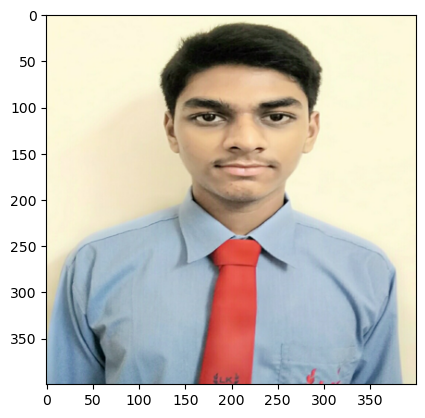

In [76]:
content_image = np.array(Image.open("images/omrai.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

<a name='5-2'></a>
### 5.2 Load the Style Image
Now load, reshape and normalize your "style" image

(1, 400, 400, 3)


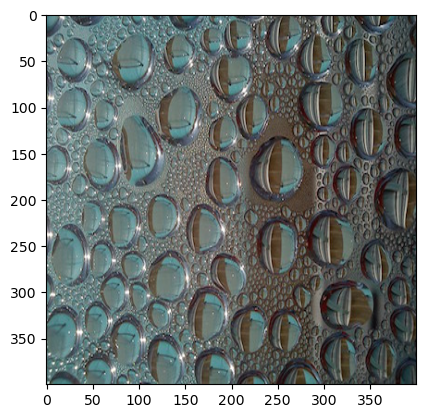

In [77]:
style_image =  np.array(Image.open("images/drop-of-water.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

<a name='5-3'></a>
### 5.3 Randomly Initialize the Image to be Generated
Now, you get to initialize the "generated" image as a noisy image created from the content_image.

* The generated image is slightly correlated with the content image.
* By initializing the pixels of the generated image to be mostly noise but slightly correlated with the content image, this will help the content of the "generated" image more rapidly match the content of the "content" image. 

(1, 400, 400, 3)


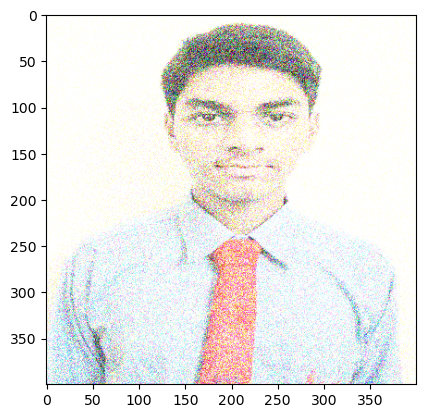

In [78]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), 0, 0.8)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

<a name='5-4'></a>
## 5.4 - Load Pre-trained VGG19 Model
define a function which loads the VGG19 model and returns a list of the outputs for the middle layers.

In [79]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # layer_names has 'layer' elements in it.
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

Now, define the content layer and build the model.

In [80]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Save the outputs for the content and style layers in separate variables.

In [81]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style enconder

<a name='5-5'></a>
### 5.5 - Compute Total Cost

<a name='5-5-1'></a>
#### 5.5.1 - Compute Content Cost


1. Set a_C to be the tensor giving the hidden layer activation for layer "block5_conv4".
2. Set a_G to be the tensor giving the hidden layer activation for the same layer. 
3. Compute the content cost using a_C and a_G.

In [82]:
# Assign the content image to be the input of the VGG model.  
# Set a_C to be the hidden layer activation from the layer we have selected
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

# Set a_G to be the hidden layer activation from same layer. Here, a_G references model['conv4_2'] 
# and isn't evaluated yet. Later in the code, we'll assign the image G as the model input.
a_G = vgg_model_outputs(generated_image)

# Compute the content cost
J_content = compute_content_cost(a_C, a_G)

print(J_content)

tf.Tensor(0.007842222, shape=(), dtype=float32)


<a name='5-5-2'></a>
#### 5.5.2 - Compute Style Cost

The code below sets a_S to be the tensor giving the hidden layer activation for `STYLE_LAYERS`.

In [83]:
# Assign the input of the model to be the "style" image 
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

# Compute the style cost
J_style = compute_style_cost(a_S, a_G)
print(J_style)

tf.Tensor(3555.8875, shape=(), dtype=float32)


#### Important
The precomputed encoded images (a_S and a_C) calculated at this step will be used in training to calculating cost w.r.t a_G (the vgg_model_outputs) for the current generated image at each training step

In [84]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    
    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

<a name='ex-6'></a>
### train_step 

Implement the train_step() function for transfer learning

* Use the Adam optimizer to minimize the total cost `J`.
* Use a learning rate of 0.03.  
* Adam Optimizer documentation 
* tf.GradientTape to update the image.
* Within the tf.GradientTape():
   * Compute the encoding of the generated image using vgg_model_outputs
   * Compute the total cost J, using the variables a_G, a_S and a_G
   * Use `alpha = 10` and `beta = 40`.

In [85]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.03)

def train_step(generated_image, alpha = 10, beta = 40):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C
        # Compute a_G as the vgg_model_outputs for the current generated image
        
        
        #(1 line)
        a_G = vgg_model_outputs(generated_image)
        
        # Compute the style cost
        #(1 line)
        J_style = compute_style_cost(a_S, a_G)

        #(2 lines)
        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style,alpha = alpha, beta = beta)
        
        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    # For grading purposes
    return J

In [86]:
# must run the last cell before this one. You will get an error if not.
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))

J1 = train_step(generated_image)
print(J1)
assert type(J1) == EagerTensor, f"Wrong type {type(J1)} != {EagerTensor}"

J2 = train_step(generated_image)
print(J2)


tf.Tensor(93339.21, shape=(), dtype=float32)
tf.Tensor(68058.68, shape=(), dtype=float32)


<a name='5-6'></a>
### 5.6 - Train the Model
Neural Style Transfer is generally trained using GPUs.
NST took about 2.5 hours using CPU (i3-4th gen) in my machine.

By increasing the learning rate we can speed up the style transfer, but often at the cost of quality.

Epoch 0 


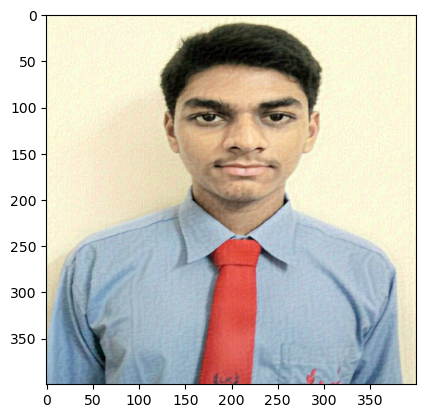

Epoch 1 
Epoch 2 
Epoch 3 
Epoch 4 
Epoch 5 
Epoch 6 
Epoch 7 
Epoch 8 
Epoch 9 
Epoch 10 
Epoch 11 
Epoch 12 
Epoch 13 
Epoch 14 
Epoch 15 
Epoch 16 
Epoch 17 
Epoch 18 
Epoch 19 
Epoch 20 
Epoch 21 
Epoch 22 
Epoch 23 
Epoch 24 
Epoch 25 
Epoch 26 
Epoch 27 
Epoch 28 
Epoch 29 
Epoch 30 
Epoch 31 
Epoch 32 
Epoch 33 
Epoch 34 
Epoch 35 
Epoch 36 
Epoch 37 
Epoch 38 
Epoch 39 
Epoch 40 
Epoch 41 
Epoch 42 
Epoch 43 
Epoch 44 
Epoch 45 
Epoch 46 
Epoch 47 
Epoch 48 
Epoch 49 
Epoch 50 
Epoch 51 
Epoch 52 
Epoch 53 
Epoch 54 
Epoch 55 
Epoch 56 
Epoch 57 
Epoch 58 
Epoch 59 
Epoch 60 
Epoch 61 
Epoch 62 
Epoch 63 
Epoch 64 
Epoch 65 
Epoch 66 
Epoch 67 
Epoch 68 
Epoch 69 
Epoch 70 
Epoch 71 
Epoch 72 
Epoch 73 
Epoch 74 
Epoch 75 
Epoch 76 
Epoch 77 
Epoch 78 
Epoch 79 
Epoch 80 
Epoch 81 
Epoch 82 
Epoch 83 
Epoch 84 
Epoch 85 
Epoch 86 
Epoch 87 
Epoch 88 
Epoch 89 
Epoch 90 
Epoch 91 
Epoch 92 
Epoch 93 
Epoch 94 
Epoch 95 
Epoch 96 
Epoch 97 
Epoch 98 
Epoch 99 
Epoch 100 
Epoch 10

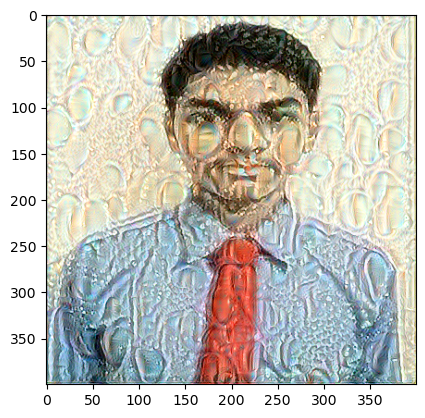

Epoch 251 
Epoch 252 
Epoch 253 
Epoch 254 
Epoch 255 
Epoch 256 
Epoch 257 
Epoch 258 
Epoch 259 
Epoch 260 
Epoch 261 
Epoch 262 
Epoch 263 
Epoch 264 
Epoch 265 
Epoch 266 
Epoch 267 
Epoch 268 
Epoch 269 
Epoch 270 
Epoch 271 
Epoch 272 
Epoch 273 
Epoch 274 
Epoch 275 
Epoch 276 
Epoch 277 
Epoch 278 
Epoch 279 
Epoch 280 
Epoch 281 
Epoch 282 
Epoch 283 
Epoch 284 
Epoch 285 
Epoch 286 
Epoch 287 
Epoch 288 
Epoch 289 
Epoch 290 
Epoch 291 
Epoch 292 
Epoch 293 
Epoch 294 
Epoch 295 
Epoch 296 
Epoch 297 
Epoch 298 
Epoch 299 
Epoch 300 
Epoch 301 
Epoch 302 
Epoch 303 
Epoch 304 
Epoch 305 
Epoch 306 
Epoch 307 
Epoch 308 
Epoch 309 
Epoch 310 
Epoch 311 
Epoch 312 
Epoch 313 
Epoch 314 
Epoch 315 
Epoch 316 
Epoch 317 
Epoch 318 
Epoch 319 
Epoch 320 
Epoch 321 
Epoch 322 
Epoch 323 
Epoch 324 
Epoch 325 
Epoch 326 
Epoch 327 
Epoch 328 
Epoch 329 
Epoch 330 
Epoch 331 
Epoch 332 
Epoch 333 
Epoch 334 
Epoch 335 
Epoch 336 
Epoch 337 
Epoch 338 
Epoch 339 
Epoch 340 
Epoch 341 

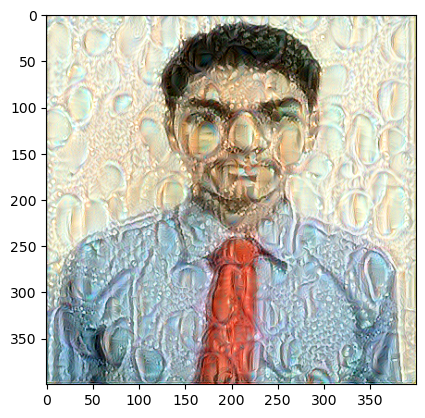

Epoch 501 
Epoch 502 
Epoch 503 
Epoch 504 
Epoch 505 
Epoch 506 
Epoch 507 
Epoch 508 
Epoch 509 
Epoch 510 
Epoch 511 
Epoch 512 
Epoch 513 
Epoch 514 
Epoch 515 
Epoch 516 
Epoch 517 
Epoch 518 
Epoch 519 
Epoch 520 
Epoch 521 
Epoch 522 
Epoch 523 
Epoch 524 
Epoch 525 
Epoch 526 
Epoch 527 
Epoch 528 
Epoch 529 
Epoch 530 
Epoch 531 
Epoch 532 
Epoch 533 
Epoch 534 
Epoch 535 
Epoch 536 
Epoch 537 
Epoch 538 
Epoch 539 
Epoch 540 
Epoch 541 
Epoch 542 
Epoch 543 
Epoch 544 
Epoch 545 
Epoch 546 
Epoch 547 
Epoch 548 
Epoch 549 
Epoch 550 
Epoch 551 
Epoch 552 
Epoch 553 
Epoch 554 
Epoch 555 
Epoch 556 
Epoch 557 
Epoch 558 
Epoch 559 
Epoch 560 
Epoch 561 
Epoch 562 
Epoch 563 
Epoch 564 
Epoch 565 
Epoch 566 
Epoch 567 
Epoch 568 
Epoch 569 
Epoch 570 
Epoch 571 
Epoch 572 
Epoch 573 
Epoch 574 
Epoch 575 
Epoch 576 
Epoch 577 
Epoch 578 
Epoch 579 
Epoch 580 
Epoch 581 
Epoch 582 
Epoch 583 
Epoch 584 
Epoch 585 
Epoch 586 
Epoch 587 
Epoch 588 
Epoch 589 
Epoch 590 
Epoch 591 

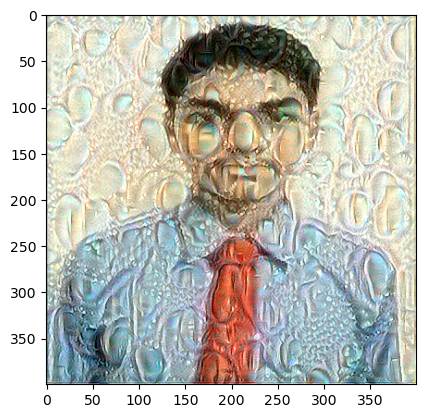

Epoch 751 
Epoch 752 
Epoch 753 
Epoch 754 
Epoch 755 
Epoch 756 
Epoch 757 
Epoch 758 
Epoch 759 
Epoch 760 
Epoch 761 
Epoch 762 
Epoch 763 
Epoch 764 
Epoch 765 
Epoch 766 
Epoch 767 
Epoch 768 
Epoch 769 
Epoch 770 
Epoch 771 
Epoch 772 
Epoch 773 
Epoch 774 
Epoch 775 
Epoch 776 
Epoch 777 
Epoch 778 
Epoch 779 
Epoch 780 
Epoch 781 
Epoch 782 
Epoch 783 
Epoch 784 
Epoch 785 
Epoch 786 
Epoch 787 
Epoch 788 
Epoch 789 
Epoch 790 
Epoch 791 
Epoch 792 
Epoch 793 
Epoch 794 
Epoch 795 
Epoch 796 
Epoch 797 
Epoch 798 
Epoch 799 
Epoch 800 
Epoch 801 
Epoch 802 
Epoch 803 
Epoch 804 
Epoch 805 
Epoch 806 
Epoch 807 
Epoch 808 
Epoch 809 
Epoch 810 
Epoch 811 
Epoch 812 
Epoch 813 
Epoch 814 
Epoch 815 
Epoch 816 
Epoch 817 
Epoch 818 
Epoch 819 
Epoch 820 
Epoch 821 
Epoch 822 
Epoch 823 
Epoch 824 
Epoch 825 
Epoch 826 
Epoch 827 
Epoch 828 
Epoch 829 
Epoch 830 
Epoch 831 
Epoch 832 
Epoch 833 
Epoch 834 
Epoch 835 
Epoch 836 
Epoch 837 
Epoch 838 
Epoch 839 
Epoch 840 
Epoch 841 

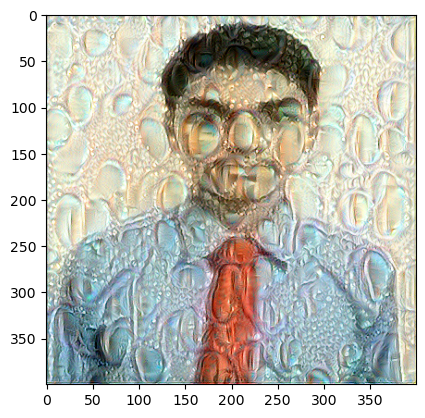

Epoch 1001 
Epoch 1002 
Epoch 1003 
Epoch 1004 
Epoch 1005 
Epoch 1006 
Epoch 1007 
Epoch 1008 
Epoch 1009 
Epoch 1010 
Epoch 1011 
Epoch 1012 
Epoch 1013 
Epoch 1014 
Epoch 1015 
Epoch 1016 
Epoch 1017 
Epoch 1018 
Epoch 1019 
Epoch 1020 
Epoch 1021 
Epoch 1022 
Epoch 1023 
Epoch 1024 
Epoch 1025 
Epoch 1026 
Epoch 1027 
Epoch 1028 
Epoch 1029 
Epoch 1030 
Epoch 1031 
Epoch 1032 
Epoch 1033 
Epoch 1034 
Epoch 1035 
Epoch 1036 
Epoch 1037 
Epoch 1038 
Epoch 1039 
Epoch 1040 
Epoch 1041 
Epoch 1042 
Epoch 1043 
Epoch 1044 
Epoch 1045 
Epoch 1046 
Epoch 1047 
Epoch 1048 
Epoch 1049 
Epoch 1050 
Epoch 1051 
Epoch 1052 
Epoch 1053 
Epoch 1054 
Epoch 1055 
Epoch 1056 
Epoch 1057 
Epoch 1058 
Epoch 1059 
Epoch 1060 
Epoch 1061 
Epoch 1062 
Epoch 1063 
Epoch 1064 
Epoch 1065 
Epoch 1066 
Epoch 1067 
Epoch 1068 
Epoch 1069 
Epoch 1070 
Epoch 1071 
Epoch 1072 
Epoch 1073 
Epoch 1074 
Epoch 1075 
Epoch 1076 
Epoch 1077 
Epoch 1078 
Epoch 1079 
Epoch 1080 
Epoch 1081 
Epoch 1082 
Epoch 1083 
Epoc

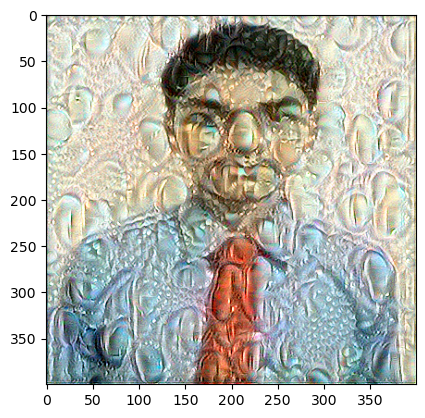

Epoch 1251 
Epoch 1252 
Epoch 1253 
Epoch 1254 
Epoch 1255 
Epoch 1256 
Epoch 1257 
Epoch 1258 
Epoch 1259 
Epoch 1260 
Epoch 1261 
Epoch 1262 
Epoch 1263 
Epoch 1264 
Epoch 1265 
Epoch 1266 
Epoch 1267 
Epoch 1268 
Epoch 1269 
Epoch 1270 
Epoch 1271 
Epoch 1272 
Epoch 1273 
Epoch 1274 
Epoch 1275 
Epoch 1276 
Epoch 1277 
Epoch 1278 
Epoch 1279 
Epoch 1280 
Epoch 1281 
Epoch 1282 
Epoch 1283 
Epoch 1284 
Epoch 1285 
Epoch 1286 
Epoch 1287 
Epoch 1288 
Epoch 1289 
Epoch 1290 
Epoch 1291 
Epoch 1292 
Epoch 1293 
Epoch 1294 
Epoch 1295 
Epoch 1296 
Epoch 1297 
Epoch 1298 
Epoch 1299 
Epoch 1300 
Epoch 1301 
Epoch 1302 
Epoch 1303 
Epoch 1304 
Epoch 1305 
Epoch 1306 
Epoch 1307 
Epoch 1308 
Epoch 1309 
Epoch 1310 
Epoch 1311 
Epoch 1312 
Epoch 1313 
Epoch 1314 
Epoch 1315 
Epoch 1316 
Epoch 1317 
Epoch 1318 
Epoch 1319 
Epoch 1320 
Epoch 1321 
Epoch 1322 
Epoch 1323 
Epoch 1324 
Epoch 1325 
Epoch 1326 
Epoch 1327 
Epoch 1328 
Epoch 1329 
Epoch 1330 
Epoch 1331 
Epoch 1332 
Epoch 1333 
Epoc

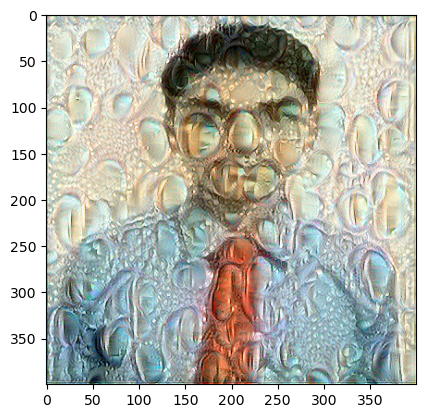

Epoch 1501 
Epoch 1502 
Epoch 1503 
Epoch 1504 
Epoch 1505 
Epoch 1506 
Epoch 1507 
Epoch 1508 
Epoch 1509 
Epoch 1510 
Epoch 1511 
Epoch 1512 
Epoch 1513 
Epoch 1514 
Epoch 1515 
Epoch 1516 
Epoch 1517 
Epoch 1518 
Epoch 1519 
Epoch 1520 
Epoch 1521 
Epoch 1522 
Epoch 1523 
Epoch 1524 
Epoch 1525 
Epoch 1526 
Epoch 1527 
Epoch 1528 
Epoch 1529 
Epoch 1530 
Epoch 1531 
Epoch 1532 
Epoch 1533 
Epoch 1534 
Epoch 1535 
Epoch 1536 
Epoch 1537 
Epoch 1538 
Epoch 1539 
Epoch 1540 
Epoch 1541 
Epoch 1542 
Epoch 1543 
Epoch 1544 
Epoch 1545 
Epoch 1546 
Epoch 1547 
Epoch 1548 
Epoch 1549 
Epoch 1550 
Epoch 1551 
Epoch 1552 
Epoch 1553 
Epoch 1554 
Epoch 1555 
Epoch 1556 
Epoch 1557 
Epoch 1558 
Epoch 1559 
Epoch 1560 
Epoch 1561 
Epoch 1562 
Epoch 1563 
Epoch 1564 
Epoch 1565 
Epoch 1566 
Epoch 1567 
Epoch 1568 
Epoch 1569 
Epoch 1570 
Epoch 1571 
Epoch 1572 
Epoch 1573 
Epoch 1574 
Epoch 1575 
Epoch 1576 
Epoch 1577 
Epoch 1578 
Epoch 1579 
Epoch 1580 
Epoch 1581 
Epoch 1582 
Epoch 1583 
Epoc

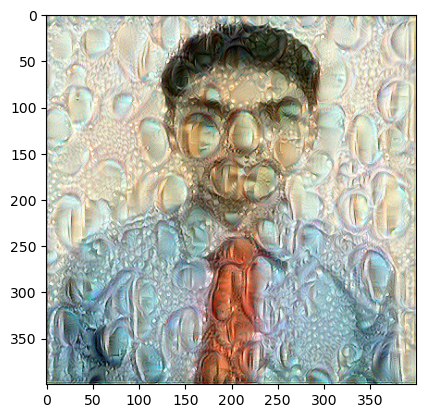

Epoch 1751 
Epoch 1752 
Epoch 1753 
Epoch 1754 
Epoch 1755 
Epoch 1756 
Epoch 1757 
Epoch 1758 
Epoch 1759 
Epoch 1760 
Epoch 1761 
Epoch 1762 
Epoch 1763 
Epoch 1764 
Epoch 1765 
Epoch 1766 
Epoch 1767 
Epoch 1768 
Epoch 1769 
Epoch 1770 
Epoch 1771 
Epoch 1772 
Epoch 1773 
Epoch 1774 
Epoch 1775 
Epoch 1776 
Epoch 1777 
Epoch 1778 
Epoch 1779 
Epoch 1780 
Epoch 1781 
Epoch 1782 
Epoch 1783 
Epoch 1784 
Epoch 1785 
Epoch 1786 
Epoch 1787 
Epoch 1788 
Epoch 1789 
Epoch 1790 
Epoch 1791 
Epoch 1792 
Epoch 1793 
Epoch 1794 
Epoch 1795 
Epoch 1796 
Epoch 1797 
Epoch 1798 
Epoch 1799 
Epoch 1800 
Epoch 1801 
Epoch 1802 
Epoch 1803 
Epoch 1804 
Epoch 1805 
Epoch 1806 
Epoch 1807 
Epoch 1808 
Epoch 1809 
Epoch 1810 
Epoch 1811 
Epoch 1812 
Epoch 1813 
Epoch 1814 
Epoch 1815 
Epoch 1816 
Epoch 1817 
Epoch 1818 
Epoch 1819 
Epoch 1820 
Epoch 1821 
Epoch 1822 
Epoch 1823 
Epoch 1824 
Epoch 1825 
Epoch 1826 
Epoch 1827 
Epoch 1828 
Epoch 1829 
Epoch 1830 
Epoch 1831 
Epoch 1832 
Epoch 1833 
Epoc

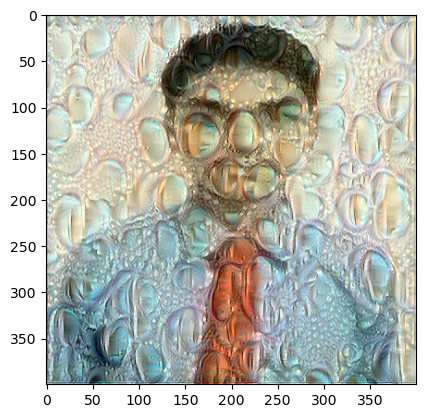

Epoch 2001 
Epoch 2002 
Epoch 2003 
Epoch 2004 
Epoch 2005 
Epoch 2006 
Epoch 2007 
Epoch 2008 
Epoch 2009 
Epoch 2010 
Epoch 2011 
Epoch 2012 
Epoch 2013 
Epoch 2014 
Epoch 2015 
Epoch 2016 
Epoch 2017 
Epoch 2018 
Epoch 2019 
Epoch 2020 
Epoch 2021 
Epoch 2022 
Epoch 2023 
Epoch 2024 
Epoch 2025 
Epoch 2026 
Epoch 2027 
Epoch 2028 
Epoch 2029 
Epoch 2030 
Epoch 2031 
Epoch 2032 
Epoch 2033 
Epoch 2034 
Epoch 2035 
Epoch 2036 
Epoch 2037 
Epoch 2038 
Epoch 2039 
Epoch 2040 
Epoch 2041 
Epoch 2042 
Epoch 2043 
Epoch 2044 
Epoch 2045 
Epoch 2046 
Epoch 2047 
Epoch 2048 
Epoch 2049 
Epoch 2050 
Epoch 2051 
Epoch 2052 
Epoch 2053 
Epoch 2054 
Epoch 2055 
Epoch 2056 
Epoch 2057 
Epoch 2058 
Epoch 2059 
Epoch 2060 
Epoch 2061 
Epoch 2062 
Epoch 2063 
Epoch 2064 
Epoch 2065 
Epoch 2066 
Epoch 2067 
Epoch 2068 
Epoch 2069 
Epoch 2070 
Epoch 2071 
Epoch 2072 
Epoch 2073 
Epoch 2074 
Epoch 2075 
Epoch 2076 
Epoch 2077 
Epoch 2078 
Epoch 2079 
Epoch 2080 
Epoch 2081 
Epoch 2082 
Epoch 2083 
Epoc

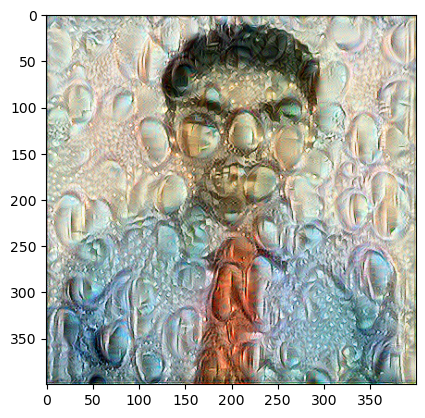

Epoch 2251 
Epoch 2252 
Epoch 2253 
Epoch 2254 
Epoch 2255 
Epoch 2256 
Epoch 2257 
Epoch 2258 
Epoch 2259 
Epoch 2260 
Epoch 2261 
Epoch 2262 
Epoch 2263 
Epoch 2264 
Epoch 2265 
Epoch 2266 
Epoch 2267 
Epoch 2268 
Epoch 2269 
Epoch 2270 
Epoch 2271 
Epoch 2272 
Epoch 2273 
Epoch 2274 
Epoch 2275 
Epoch 2276 
Epoch 2277 
Epoch 2278 
Epoch 2279 
Epoch 2280 
Epoch 2281 
Epoch 2282 
Epoch 2283 
Epoch 2284 
Epoch 2285 
Epoch 2286 
Epoch 2287 
Epoch 2288 
Epoch 2289 
Epoch 2290 
Epoch 2291 
Epoch 2292 
Epoch 2293 
Epoch 2294 
Epoch 2295 
Epoch 2296 
Epoch 2297 
Epoch 2298 
Epoch 2299 
Epoch 2300 
Epoch 2301 
Epoch 2302 
Epoch 2303 
Epoch 2304 
Epoch 2305 
Epoch 2306 
Epoch 2307 
Epoch 2308 
Epoch 2309 
Epoch 2310 
Epoch 2311 
Epoch 2312 
Epoch 2313 
Epoch 2314 
Epoch 2315 
Epoch 2316 
Epoch 2317 
Epoch 2318 
Epoch 2319 
Epoch 2320 
Epoch 2321 
Epoch 2322 
Epoch 2323 
Epoch 2324 
Epoch 2325 
Epoch 2326 
Epoch 2327 
Epoch 2328 
Epoch 2329 
Epoch 2330 
Epoch 2331 
Epoch 2332 
Epoch 2333 
Epoc

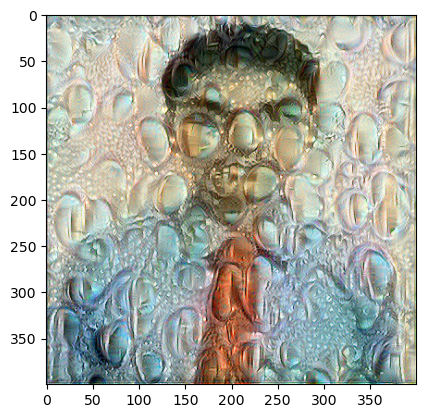

In [49]:
# Show the generated image at some epochs
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
# optimizer.apply_gradients([(grad, generated_image)])
epochs = 2501
for i in range(epochs):
    train_step(generated_image,alpha = 100, beta = 10**2)
#     if i % 250 == 0:
    print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"output/image_{i}.jpg")
        plt.show() 

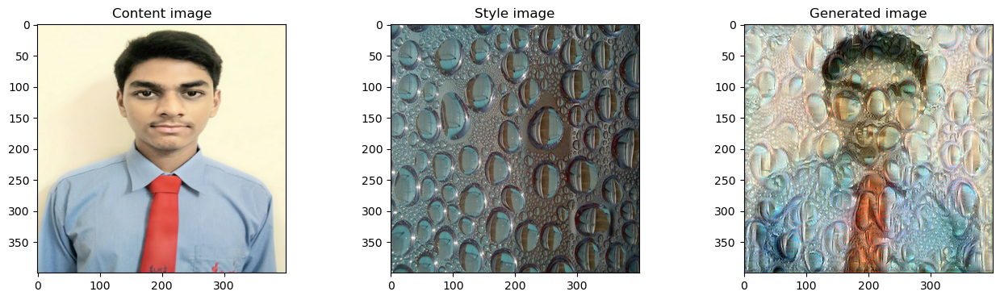

<Figure size 640x480 with 0 Axes>

In [50]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()
plt.savefig("My_Result.jpg")

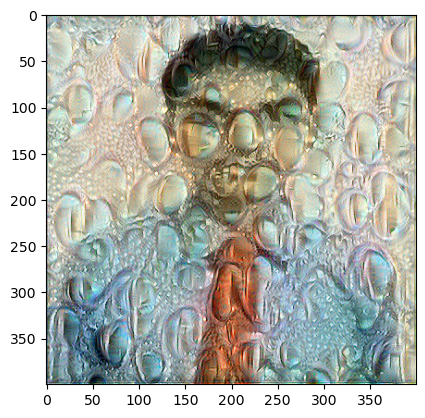

In [59]:
fig = plt.figure()
imshow(generated_image[0])
# plt.savefig('images/my_enerated_image.png')
# plt.close(fig)


Now, run the following code cell to see the results!

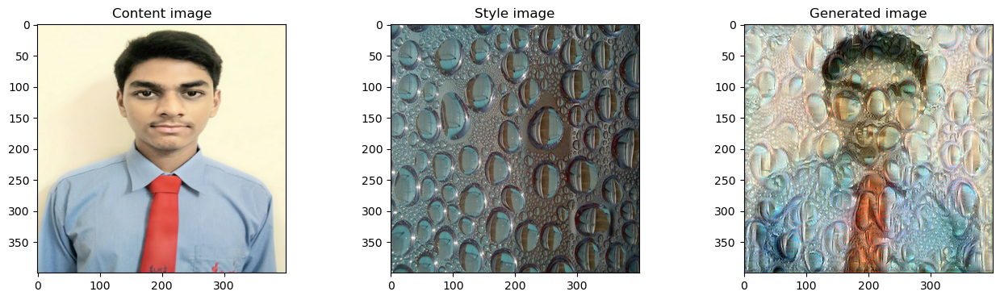

In [60]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

And now we have it!

Running for around 20000 epochs with a learning rate of 0.001, you should see something like the image presented below on the right:

<img src="images/louvre_generated.png" style="width:800px;height:300px;">

The hyperparameters were set to see an initial result. To get the best looking results, we can try running the optimization algorithm longer (and perhaps with a smaller learning rate).

<a name='6'></a>
## 6 - Test With Your Own Image 

Finally,rerun the algorithm on your different images! 

To do so, go back to part(4) and change the content image and style image with your own pictures. In detail, here's what you should do:


==> Change the code in [part(4)](#part(4)) from :

```py
content_image = np.array(Image.open("images/omrai.jpg").resize((img_size, img_size)))
style_image =  np.array(Image.open("images/drop-of-water.jpg").resize((img_size, img_size)))

```

&emsp;&emsp;to:

``` py
content_image = np.array(Image.open("images/my_content.jpg").resize((img_size, img_size)))
style_image =  np.array(Image.open("my_style.jpg").resize((img_size, img_size)))

```
Here are some ways to tune hyperparameters: 
- To select different layers to represent the style, redefine `STYLE_LAYERS`
- To alter the number of iterations you want to run the algorithm, try changing `num_iterations`
- To alter the relative weight of content versus style, try altering alpha and beta values

### Conclusion

In NST we have used a model in which the optimization algorithm updates the pixel values rather than the neural network's parameters. Deep learning has many different types of models and this is only one of them! 

<font color = 'blue'>
    
## Note
- Neural Style Transfer is an algorithm that given a content image C and a style image S can generate an artistic image
- It uses representations (hidden layer activations) based on a pretrained ConvNet. 
- The content cost function is computed using one hidden layer's activations.
- The style cost function for one layer is computed using the Gram matrix of that layer's activations. The overall style cost function is obtained using several hidden layers.
- Optimizing the total cost function results in synthesizing new images. 




<a name='7'></a>
## 7 - References

The Neural Style Transfer algorithm was due to Gatys et al. (2015). Harish Narayanan and Github user "log0" also have highly readable write-ups this lab was inspired by. The pre-trained network used in this implementation is a VGG network, which is due to Simonyan and Zisserman (2015). Pre-trained weights were from the work of the MathConvNet team. 

- Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, (2015). [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576) 
- Harish Narayanan, [Convolutional neural networks for artistic style transfer.](https://harishnarayanan.org/writing/artistic-style-transfer/)
- Log0, [TensorFlow Implementation of "A Neural Algorithm of Artistic Style".](http://www.chioka.in/tensorflow-implementation-neural-algorithm-of-artistic-style)
- Karen Simonyan and Andrew Zisserman (2015). [Very deep convolutional networks for large-scale image recognition](https://arxiv.org/pdf/1409.1556.pdf)
- [MatConvNet.](http://www.vlfeat.org/matconvnet/pretrained/)
